In [1]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns



In [2]:
listDf = pd.read_csv('animelist.csv')
ratingDf = pd.read_csv('rating_complete1.csv')
synopsisDf = pd.read_csv('anime_with_synopsis.csv')
df = pd.read_csv('anime.csv')

In [3]:
listDf.head(5)

,user_id,anime_id,rating,watching_status,watched_episodes
0,0,67,9,1,1
1,0,6702,7,1,4
2,0,242,10,1,4
3,0,4898,0,1,1
4,0,21,10,1,0


In [4]:
df.head(5)

,MAL_ID,Name,Score,Genres,English name,Japanese name,Type,Episodes,Aired,Premiered,...,Score-10,Score-9,Score-8,Score-7,Score-6,Score-5,Score-4,Score-3,Score-2,Score-1
0,1,Cowboy Bebop,8.78,"Action, Adventure, Comedy, Drama, Sci-Fi, Space",Cowboy Bebop,カウボーイビバップ,TV,26,"Apr 3, 1998 to Apr 24, 1999",Spring 1998,...,229170.0,182126.0,131625.0,62330.0,20688.0,8904.0,3184.0,1357.0,741.0,1580.0
1,5,Cowboy Bebop: Tengoku no Tobira,8.39,"Action, Drama, Mystery, Sci-Fi, Space",Cowboy Bebop:The Movie,カウボーイビバップ 天国の扉,Movie,1,"Sep 1, 2001",Unknown,...,30043.0,49201.0,49505.0,22632.0,5805.0,1877.0,577.0,221.0,109.0,379.0
2,6,Trigun,8.24,"Action, Sci-Fi, Adventure, Comedy, Drama, Shounen",Trigun,トライガン,TV,26,"Apr 1, 1998 to Sep 30, 1998",Spring 1998,...,50229.0,75651.0,86142.0,49432.0,15376.0,5838.0,1965.0,664.0,316.0,533.0
3,7,Witch Hunter Robin,7.27,"Action, Mystery, Police, Supernatural, Drama, ...",Witch Hunter Robin,Witch Hunter ROBIN (ウイッチハンターロビン),TV,26,"Jul 2, 2002 to Dec 24, 2002",Summer 2002,...,2182.0,4806.0,10128.0,11618.0,5709.0,2920.0,1083.0,353.0,164.0,131.0
4,8,Bouken Ou Beet,6.98,"Adventure, Fantasy, Shounen, Supernatural",Beet the Vandel Buster,冒険王ビィト,TV,52,"Sep 30, 2004 to Sep 29, 2005",Fall 2004,...,312.0,529.0,1242.0,1713.0,1068.0,634.0,265.0,83.0,50.0,27.0


In [5]:
ratingDf.head(5)

,user_id,anime_id,rating
0,0,430,9
1,0,1004,5
2,0,3010,7
3,0,570,7
4,0,2762,9


## EXPLORATION

In [6]:
synopsisDf.head(5)

,MAL_ID,Name,Score,Genres,sypnopsis
0,1,Cowboy Bebop,8.78,"Action, Adventure, Comedy, Drama, Sci-Fi, Space","In the year 2071, humanity has colonized sever..."
1,5,Cowboy Bebop: Tengoku no Tobira,8.39,"Action, Drama, Mystery, Sci-Fi, Space","other day, another bounty—such is the life of ..."
2,6,Trigun,8.24,"Action, Sci-Fi, Adventure, Comedy, Drama, Shounen","Vash the Stampede is the man with a $$60,000,0..."
3,7,Witch Hunter Robin,7.27,"Action, Mystery, Police, Supernatural, Drama, ...",ches are individuals with special powers like ...
4,8,Bouken Ou Beet,6.98,"Adventure, Fantasy, Shounen, Supernatural",It is the dark century and the people are suff...


In [7]:
listDf['watching_status'].value_counts()

watching_status
2    646830
6    271876
1     53481
4     40305
3     36083
Name: count, dtype: int64

### Separating WATCHED and DROPPED from watching status
##### so that we can use the data to remove it from the other dataFrame

In [8]:
WDstatus = listDf[listDf['watching_status'].isin([2,4])]
listDf = listDf[~listDf['watching_status'].isin([2,4])]

In [9]:
WDstatus = WDstatus.reset_index(drop= True)

In [10]:
listDf['watching_status'].value_counts()

watching_status
6    271876
1     53481
3     36083
Name: count, dtype: int64

In [11]:
listDf.isnull().sum()

user_id             0
anime_id            0
rating              0
watching_status     0
watched_episodes    0
dtype: int64

In [12]:
pivot_data = listDf.pivot_table(index = 'anime_id' , columns= 'rating' , aggfunc = 'size' , fill_value = 0)

pivot_data.columns = [f'Score-{col}' for col in pivot_data.columns]

pivot_data

,Score-0,Score-1,Score-2,Score-3,Score-4,Score-5,Score-6,Score-7,Score-8,Score-9,Score-10
anime_id,,,,,,,,,,,
1,479,1,0,0,1,1,2,20,26,21,17
5,90,0,0,0,0,0,0,0,0,2,0
6,280,0,0,1,0,1,3,8,8,3,3
7,124,0,0,0,0,0,3,3,2,0,0
8,14,0,0,0,0,0,0,1,0,0,0
...,...,...,...,...,...,...,...,...,...,...,...
48441,1,0,0,0,0,0,0,0,0,0,0
48456,3,0,0,0,0,0,0,0,0,0,0
48471,1,0,0,0,0,0,0,0,0,0,0


In [13]:
pivot_data = pivot_data.rename_axis('MAL_ID')

In [14]:
pivot_data.head(5)

,Score-0,Score-1,Score-2,Score-3,Score-4,Score-5,Score-6,Score-7,Score-8,Score-9,Score-10
MAL_ID,,,,,,,,,,,
1,479,1,0,0,1,1,2,20,26,21,17
5,90,0,0,0,0,0,0,0,0,2,0
6,280,0,0,1,0,1,3,8,8,3,3
7,124,0,0,0,0,0,3,3,2,0,0
8,14,0,0,0,0,0,0,1,0,0,0


### Mergin the anime list with the pivot table we created

In [15]:
realScore = pd.merge(df , pivot_data, on ='MAL_ID' , suffixes = ('df1' , 'df2'), how = 'outer' )

In [16]:
realScore.columns

Index(['MAL_ID', 'Name', 'Score', 'Genres', 'English name', 'Japanese name',
       'Type', 'Episodes', 'Aired', 'Premiered', 'Producers', 'Licensors',
       'Studios', 'Source', 'Duration', 'Rating', 'Ranked', 'Popularity',
       'Members', 'Favorites', 'Watching', 'Completed', 'On-Hold', 'Dropped',
       'Plan to Watch', 'Score-10df1', 'Score-9df1', 'Score-8df1',
       'Score-7df1', 'Score-6df1', 'Score-5df1', 'Score-4df1', 'Score-3df1',
       'Score-2df1', 'Score-1df1', 'Score-0', 'Score-1df2', 'Score-2df2',
       'Score-3df2', 'Score-4df2', 'Score-5df2', 'Score-6df2', 'Score-7df2',
       'Score-8df2', 'Score-9df2', 'Score-10df2'],
      dtype='object')

#### Removing the scores of all those shows which were rated despite not completing the show

In [17]:
for i in range(1,11):
    realScore[f'Score-{i}df1'] = realScore[f'Score-{i}df1'].replace('Unknown' , 0)
    realScore[f'Score-{i}df1'] = realScore[f'Score-{i}df1'].astype(float)

In [18]:
for i in range(1,11):
    realScore[f'Score-{i}'] = realScore[f'Score-{i}df1'] - realScore[f'Score-{i}df2'].fillna(0)

In [19]:
realScore.columns

Index(['MAL_ID', 'Name', 'Score', 'Genres', 'English name', 'Japanese name',
       'Type', 'Episodes', 'Aired', 'Premiered', 'Producers', 'Licensors',
       'Studios', 'Source', 'Duration', 'Rating', 'Ranked', 'Popularity',
       'Members', 'Favorites', 'Watching', 'Completed', 'On-Hold', 'Dropped',
       'Plan to Watch', 'Score-10df1', 'Score-9df1', 'Score-8df1',
       'Score-7df1', 'Score-6df1', 'Score-5df1', 'Score-4df1', 'Score-3df1',
       'Score-2df1', 'Score-1df1', 'Score-0', 'Score-1df2', 'Score-2df2',
       'Score-3df2', 'Score-4df2', 'Score-5df2', 'Score-6df2', 'Score-7df2',
       'Score-8df2', 'Score-9df2', 'Score-10df2', 'Score-1', 'Score-2',
       'Score-3', 'Score-4', 'Score-5', 'Score-6', 'Score-7', 'Score-8',
       'Score-9', 'Score-10'],
      dtype='object')

##### removing the other score columns 

In [20]:
realScore = realScore.drop(['Score-0'], axis = 1)

##removing these two as well cus we already sorted only the completed rating to be included
realScore = realScore.drop(['Completed'], axis = 1)
realScore = realScore.drop(['On-Hold'], axis = 1)

for i in range(1,11):
    realScore = realScore.drop([f'Score-{i}df1' , f'Score-{i}df2'],  axis =1)

In [21]:
realScore.columns

Index(['MAL_ID', 'Name', 'Score', 'Genres', 'English name', 'Japanese name',
       'Type', 'Episodes', 'Aired', 'Premiered', 'Producers', 'Licensors',
       'Studios', 'Source', 'Duration', 'Rating', 'Ranked', 'Popularity',
       'Members', 'Favorites', 'Watching', 'Dropped', 'Plan to Watch',
       'Score-1', 'Score-2', 'Score-3', 'Score-4', 'Score-5', 'Score-6',
       'Score-7', 'Score-8', 'Score-9', 'Score-10'],
      dtype='object')

In [22]:
realScore.Score

0           8.78
1           8.39
2           8.24
3           7.27
4           6.98
          ...   
17557    Unknown
17558    Unknown
17559    Unknown
17560    Unknown
17561    Unknown
Name: Score, Length: 17562, dtype: object

In [23]:
###grouping values which can be float but are still listed as object 
toConvert = ['Score' , 'Episodes' , 'Ranked']

for i in toConvert:
    print((realScore[i] == 'Unknown').sum())
    if i!=0:
        ##replacing Unknown with 0 so we can just know these are unknown values by lookin at them later moreover their quantity is less so they wont impact that much
        realScore[i] = realScore[i].replace('Unknown' , 0)
    else:
        ##replacing Unknown with middle score 5
        realScore[i] = realScore[i].replace('Unknown' , 5)
    
    realScore[i] = realScore[i].astype(float)

5141
516
1762


In [24]:
realScore['totalRatings'] = realScore['Score-1'] + realScore['Score-2'] + realScore['Score-3'] + realScore['Score-4'] + realScore['Score-5'] + realScore['Score-6'] + realScore['Score-7'] + realScore['Score-8'] + realScore['Score-9'] + realScore['Score-10']

In [25]:
catData = ['Name' , 'Genres' , 'English name' , 'Japanese name' , 'Type' , 'Aired' , 'Premiered' , 'Producers' , 'Licensors', 'Studios' , 'Source' , 'Duration' , 'Rating']
droppin = []

for i in catData:
    count = (realScore[i] == 'Unknown').sum()
    print( "Unknown Values of" ,i, ":", count)
    if count>12000:
        droppin.append(i)
        
        
## removing the droppin column cus most of the values in that is Unknown
for i in droppin:
    realScore = realScore.drop([i] , axis = 1)

Unknown Values of Name : 0
Unknown Values of Genres : 63
Unknown Values of English name : 10565
Unknown Values of Japanese name : 48
Unknown Values of Type : 37
Unknown Values of Aired : 309
Unknown Values of Premiered : 12817
Unknown Values of Producers : 7794
Unknown Values of Licensors : 13616
Unknown Values of Studios : 7079
Unknown Values of Source : 3567
Unknown Values of Duration : 555
Unknown Values of Rating : 688


In [26]:
realScore.Aired

0         Apr 3, 1998 to Apr 24, 1999
1                         Sep 1, 2001
2         Apr 1, 1998 to Sep 30, 1998
3         Jul 2, 2002 to Dec 24, 2002
4        Sep 30, 2004 to Sep 29, 2005
                     ...             
17557                Apr 4, 2021 to ?
17558                       2021 to ?
17559                  Jul, 2021 to ?
17560                         Unknown
17561                  Jul, 2021 to ?
Name: Aired, Length: 17562, dtype: object

In [27]:
def cleaning(value):

    if value == 'Unknown':
        return value
    else:
        y = value.split('to')
        return y
            
realScore['Aired'] = realScore['Aired'].apply(cleaning)

In [28]:
realScore['Aired'].head(5)

0     [Apr 3, 1998 ,  Apr 24, 1999]
1                     [Sep 1, 2001]
2     [Apr 1, 1998 ,  Sep 30, 1998]
3     [Jul 2, 2002 ,  Dec 24, 2002]
4    [Sep 30, 2004 ,  Sep 29, 2005]
Name: Aired, dtype: object

In [29]:
realScore['Premiere'] = 'Unknown'

for i in range(len(realScore['Aired'])):
    if realScore['Aired'][i] == 'Unknown':
        realScore['Premiere'][i] = 'Unknown'
    else:
        realScore['Premiere'][i] = realScore['Aired'][i][0]
    
    
realScore['Premiere']

IOPub data rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_data_rate_limit`.

Current values:
NotebookApp.iopub_data_rate_limit=1000000.0 (bytes/sec)
NotebookApp.rate_limit_window=3.0 (secs)



0         Apr 3, 1998 
1          Sep 1, 2001
2         Apr 1, 1998 
3         Jul 2, 2002 
4        Sep 30, 2004 
             ...      
17557     Apr 4, 2021 
17558            2021 
17559       Jul, 2021 
17560          Unknown
17561       Jul, 2021 
Name: Premiere, Length: 17562, dtype: object

In [30]:
realScore['Aired'][17560]

'Unknown'

In [31]:
realScore['Finished_Airing'] = -1

for i in range(len(realScore['Aired'])):
    if len(realScore['Aired'][i]) > 1:
    
        if realScore['Aired'][i][1] == ' ?':
            realScore['Finished_Airing'][i] = 0
        else:
            realScore['Finished_Airing'][i] = 1

C:\Users\kswap\AppData\Local\Temp\ipykernel_4804\1014826583.py:9: FutureWarning: ChainedAssignmentError: behaviour will change in pandas 3.0!
You are setting values through chained assignment. Currently this works in certain cases, but when using Copy-on-Write (which will become the default behaviour in pandas 3.0) this will never work to update the original DataFrame or Series, because the intermediate object on which we are setting values will behave as a copy.
A typical example is when you are setting values in a column of a DataFrame, like:

df["col"][row_indexer] = value

Use `df.loc[row_indexer, "col"] = values` instead, to perform the assignment in a single step and ensure this keeps updating the original `df`.

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

  realScore['Finished_Airing'][i] = 1
C:\Users\kswap\AppData\Local\Temp\ipykernel_4804\1014826583.py:9: SettingWithCopyWarning: 
A 

IOPub data rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_data_rate_limit`.

Current values:
NotebookApp.iopub_data_rate_limit=1000000.0 (bytes/sec)
NotebookApp.rate_limit_window=3.0 (secs)



In [32]:
realScore['Finished_Airing'].value_counts()

Finished_Airing
-1    8799
 1    8238
 0     525
Name: count, dtype: int64

In [33]:
x =(realScore['Premiere'] == 'Unknown').sum()
y =(realScore['Finished_Airing'] == -1).sum()

print("Unknown values in Premiere: " , x)
print("Unknown values in Finished_Airing: " , y)

Unknown values in Premiere:  309
Unknown values in Finished_Airing:  8799


In [34]:
realScore.Favorites

0        61971
1         1174
2        12944
3          587
4           18
         ...  
17557        6
17558       70
17559       48
17560        2
17561        0
Name: Favorites, Length: 17562, dtype: int64

In [35]:
realScore = realScore.drop(['Japanese name'], axis = 1)

In [36]:
synopsisDf.head(5)

,MAL_ID,Name,Score,Genres,sypnopsis
0,1,Cowboy Bebop,8.78,"Action, Adventure, Comedy, Drama, Sci-Fi, Space","In the year 2071, humanity has colonized sever..."
1,5,Cowboy Bebop: Tengoku no Tobira,8.39,"Action, Drama, Mystery, Sci-Fi, Space","other day, another bounty—such is the life of ..."
2,6,Trigun,8.24,"Action, Sci-Fi, Adventure, Comedy, Drama, Shounen","Vash the Stampede is the man with a $$60,000,0..."
3,7,Witch Hunter Robin,7.27,"Action, Mystery, Police, Supernatural, Drama, ...",ches are individuals with special powers like ...
4,8,Bouken Ou Beet,6.98,"Adventure, Fantasy, Shounen, Supernatural",It is the dark century and the people are suff...


In [37]:
synopsisDf.columns

Index(['MAL_ID', 'Name', 'Score', 'Genres', 'sypnopsis'], dtype='object')

In [38]:
x =(realScore['Genres'] == 'Unknown').sum()
y =(synopsisDf['Genres'] == 'Unknown').sum()

print("Unknown values in realScore genre: " , x)
print("Unknown values in synopsisDf genre: " , y)

Unknown values in realScore genre:  63
Unknown values in synopsisDf genre:  63


In [39]:
def cleaning(value):

    if value == 'Unknown':
        return value
    else:
        y = value.split(',')
        return y

realScore['Genres'] = realScore['Genres'].apply(cleaning)
synopsisDf['Genres'] = synopsisDf['Genres'].apply(cleaning)

In [40]:
realScore['Genres'][1]

['Action', ' Drama', ' Mystery', ' Sci-Fi', ' Space']

## EDA

In [41]:
realScore.dtypes

MAL_ID               int64
Name                object
Score              float64
Genres              object
English name        object
Type                object
Episodes           float64
Aired               object
Producers           object
Studios             object
Source              object
Duration            object
Rating              object
Ranked             float64
Popularity           int64
Members              int64
Favorites            int64
Watching             int64
Dropped              int64
Plan to Watch        int64
Score-1            float64
Score-2            float64
Score-3            float64
Score-4            float64
Score-5            float64
Score-6            float64
Score-7            float64
Score-8            float64
Score-9            float64
Score-10           float64
totalRatings       float64
Premiere            object
Finished_Airing      int64
dtype: object

In [42]:
realScore['Score'].describe()

count    17562.000000
mean         4.604299
std          3.054669
min          0.000000
25%          0.000000
50%          6.060000
75%          6.860000
max          9.190000
Name: Score, dtype: float64

C:\Users\kswap\AppData\Local\Temp\ipykernel_4804\3957957913.py:1: UserWarning: 

`distplot` is a deprecated function and will be removed in seaborn v0.14.0.

Please adapt your code to use either `displot` (a figure-level function with
similar flexibility) or `histplot` (an axes-level function for histograms).

For a guide to updating your code to use the new functions, please see
https://gist.github.com/mwaskom/de44147ed2974457ad6372750bbe5751

  sns.distplot(realScore['totalRatings'])


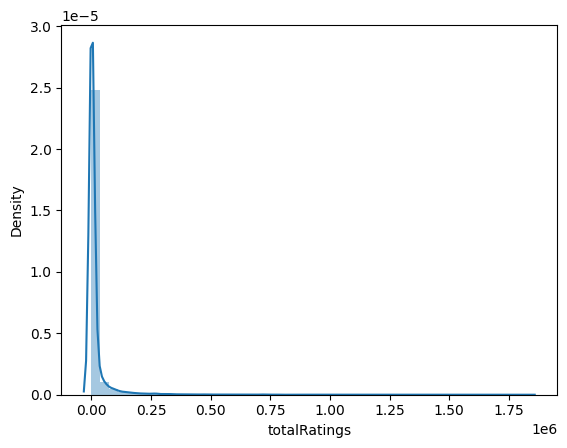

In [43]:
sns.distplot(realScore['totalRatings'])
plt.show()

In [44]:
realScore['lgTR'] = np.where(realScore['totalRatings'] > 0, np.log(realScore['totalRatings']), np.nan)

C:\Users\kswap\miniconda3\Lib\site-packages\pandas\core\arraylike.py:399: RuntimeWarning: divide by zero encountered in log
  result = getattr(ufunc, method)(*inputs, **kwargs)
C:\Users\kswap\miniconda3\Lib\site-packages\pandas\core\arraylike.py:399: RuntimeWarning: invalid value encountered in log
  result = getattr(ufunc, method)(*inputs, **kwargs)


C:\Users\kswap\AppData\Local\Temp\ipykernel_4804\4210506919.py:1: UserWarning: 

`distplot` is a deprecated function and will be removed in seaborn v0.14.0.

Please adapt your code to use either `displot` (a figure-level function with
similar flexibility) or `histplot` (an axes-level function for histograms).

For a guide to updating your code to use the new functions, please see
https://gist.github.com/mwaskom/de44147ed2974457ad6372750bbe5751

  sns.distplot(realScore['lgTR'])


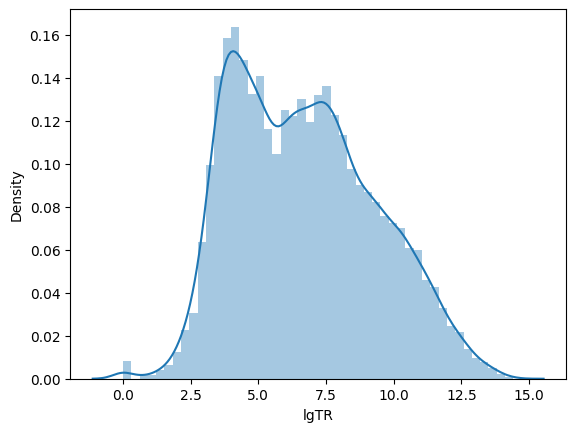

In [45]:
sns.distplot(realScore['lgTR'])
plt.show()

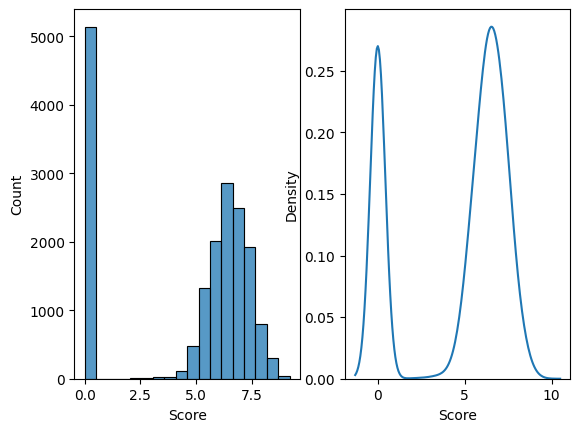

In [46]:
plt.subplot(1,2,1)
sns.histplot(x='Score' , data = realScore)

plt.subplot(1,2,2)
sns.kdeplot(x='Score' , data = realScore)

plt.show()

In [47]:
realScore['Episodes'].describe()

count    17562.000000
mean        11.186881
std         46.688414
min          0.000000
25%          1.000000
50%          1.000000
75%         12.000000
max       3057.000000
Name: Episodes, dtype: float64

#### checking the spread of data for less than 25 episode animes

In [48]:
episodeLim = realScore[realScore['Episodes'] < 25]

<Axes: xlabel='Episodes', ylabel='Density'>

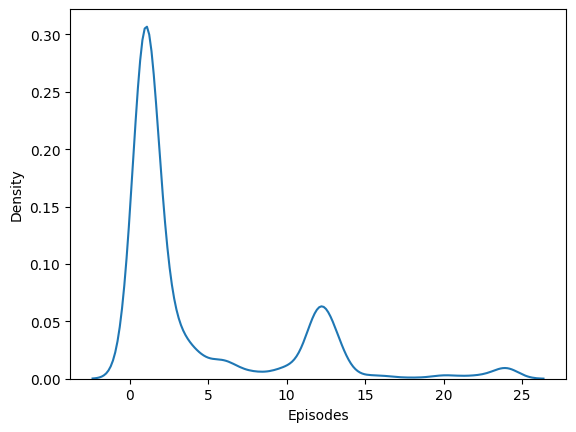

In [49]:
sns.kdeplot(x='Episodes' , data = episodeLim)

In [50]:
WDvc = WDstatus['watching_status'].value_counts()

In [51]:
WDvc

watching_status
2    646830
4     40305
Name: count, dtype: int64

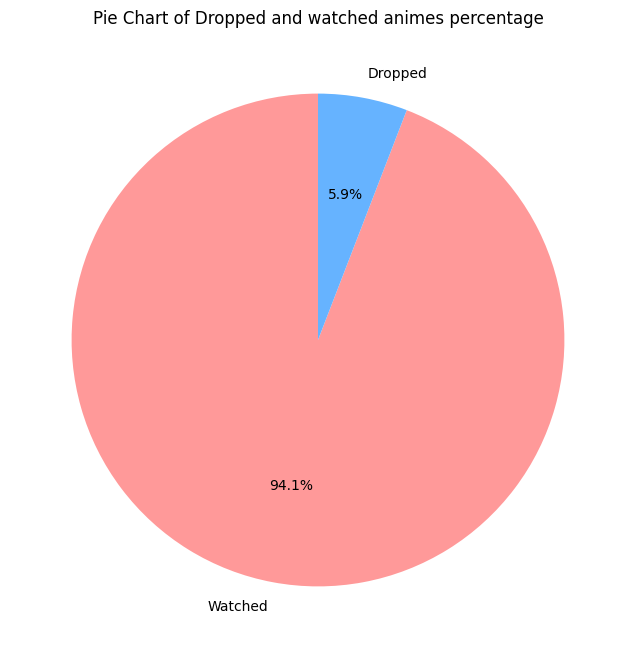

In [52]:
plt.figure(figsize=(8,8))
plt.pie(WDvc , labels = ['Watched' , 'Dropped'] , autopct = '%1.1f%%' , colors = ['#ff9999' , '#66b3ff'], startangle = 90)
plt.title('Pie Chart of Dropped and watched animes percentage')
plt.show()

In [53]:
realScore['Type'].unique()

array(['TV', 'Movie', 'OVA', 'Special', 'ONA', 'Music', 'Unknown'],
      dtype=object)

C:\Users\kswap\AppData\Local\Temp\ipykernel_4804\2196418168.py:4: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.countplot(x = realScore["Type"] , order = realScore["Type"].value_counts(ascending = True).index  , palette=colors)


<Axes: xlabel='Type', ylabel='count'>

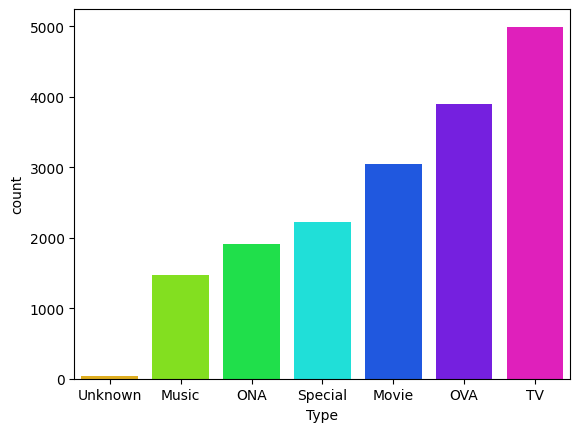

In [54]:
unique_categories = realScore["Type"].nunique()
colors = sns.color_palette("hsv", unique_categories)

sns.countplot(x = realScore["Type"] , order = realScore["Type"].value_counts(ascending = True).index  , palette=colors)

In [55]:
favc = realScore['Finished_Airing'].value_counts()

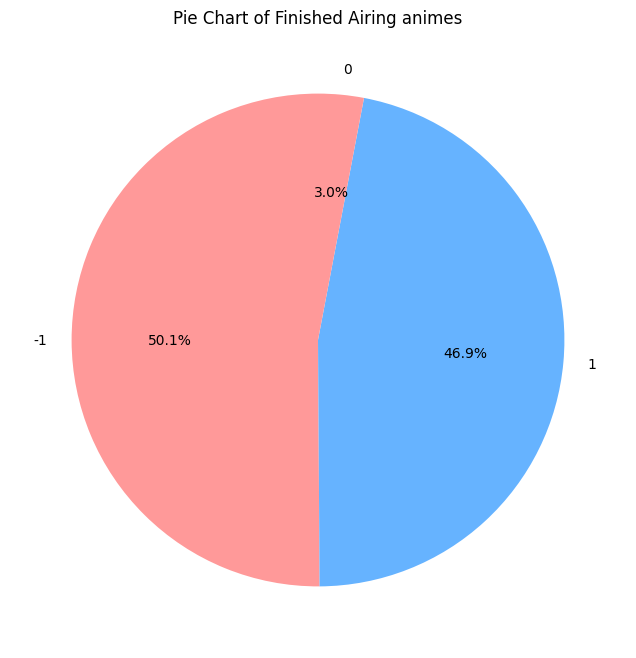

In [56]:
plt.figure(figsize=(8,8))
plt.pie(favc , labels = favc.index , autopct = '%1.1f%%' , colors = ['#ff9999' , '#66b3ff'], startangle = 90)
plt.title('Pie Chart of Finished Airing animes')
plt.show() 

In [57]:
synopsisDf.dtypes

MAL_ID        int64
Name         object
Score        object
Genres       object
sypnopsis    object
dtype: object

In [58]:
synopsisDf['Score'] = synopsisDf['Score'].replace("Unknown" , np.nan)

In [59]:
synopsisDf['Score'] = synopsisDf['Score'].astype(float)

In [60]:
df_exploded = synopsisDf.explode('Genres')
df_exploded

,MAL_ID,Name,Score,Genres,sypnopsis
0,1,Cowboy Bebop,8.78,Action,"In the year 2071, humanity has colonized sever..."
0,1,Cowboy Bebop,8.78,Adventure,"In the year 2071, humanity has colonized sever..."
0,1,Cowboy Bebop,8.78,Comedy,"In the year 2071, humanity has colonized sever..."
0,1,Cowboy Bebop,8.78,Drama,"In the year 2071, humanity has colonized sever..."
0,1,Cowboy Bebop,8.78,Sci-Fi,"In the year 2071, humanity has colonized sever..."
...,...,...,...,...,...
16212,48491,Yama no Susume: Next Summit,NaN,Adventure,New Yama no Susume anime.
16212,48491,Yama no Susume: Next Summit,NaN,Slice of Life,New Yama no Susume anime.
16212,48491,Yama no Susume: Next Summit,NaN,Comedy,New Yama no Susume anime.
16213,48492,Scarlet Nexus,NaN,Action,Solar calendar year 2020: grotesque organisms ...


C:\Users\kswap\AppData\Local\Temp\ipykernel_4804\1310529174.py:1: UserWarning: 

`distplot` is a deprecated function and will be removed in seaborn v0.14.0.

Please adapt your code to use either `displot` (a figure-level function with
similar flexibility) or `histplot` (an axes-level function for histograms).

For a guide to updating your code to use the new functions, please see
https://gist.github.com/mwaskom/de44147ed2974457ad6372750bbe5751

  sns.distplot(df_exploded['Score'])


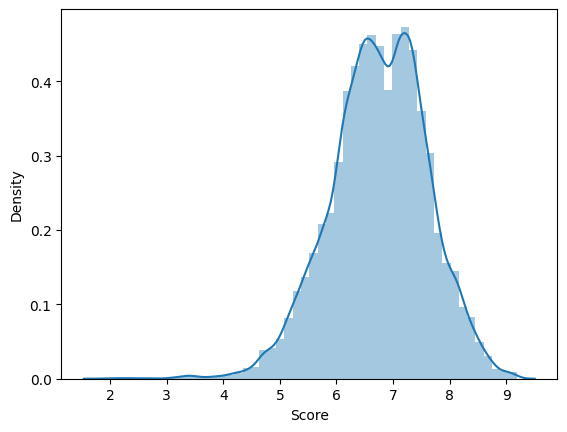

In [61]:
sns.distplot(df_exploded['Score'])
plt.show()

In [62]:
## replacing NaN with mean rating 

meanR = df_exploded['Score'].mean()

df_exploded['Score'] =  df_exploded['Score'].fillna(meanR)

In [63]:
meanR = synopsisDf['Score'].mean()

synopsisDf['Score'] =  synopsisDf['Score'].fillna(meanR)

In [64]:
import statsmodels.api as sm
from statsmodels.formula.api import ols

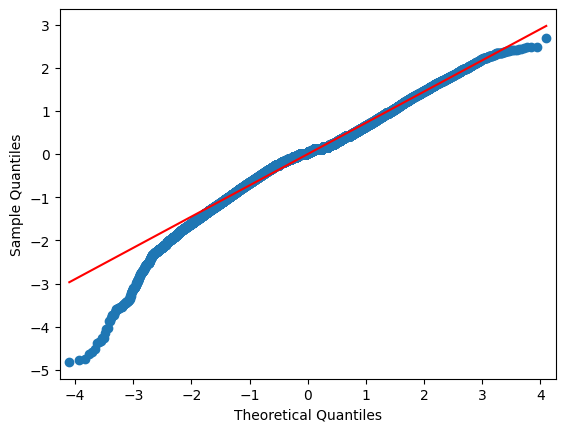

In [65]:
model = ols('Score ~ C(Genres)' , data = df_exploded).fit()

##Normality check
sm.qqplot(model.resid, line='s')
plt.show()



## we  can notice the end tail being away means there is presence of some outliers
#### making two copies and then testing for normality 

In [66]:
##we can notice the end tails being away means there is presence of some outliers
dfTest1 = df_exploded.copy()
dfTest2 = df_exploded.copy()

In [67]:
dfTest1['Score'] = np.log(df_exploded['Score'] + 1)

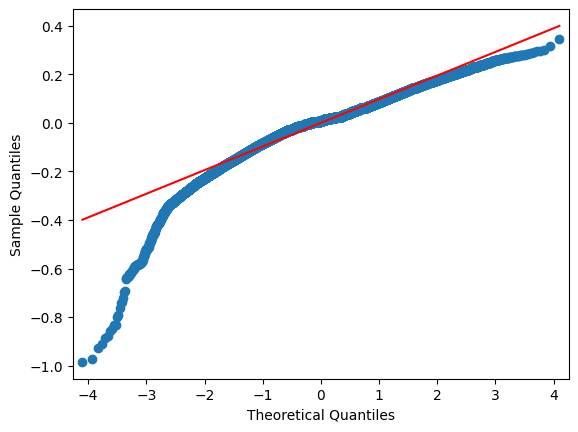

In [68]:
modelre = ols('Score ~ C(Genres)' , data = dfTest1).fit()

## plotting qq plot again
sm.qqplot(modelre.resid, line='s')
plt.show()


In [69]:
dfTest2['Score'] = np.sqrt(dfTest2['Score'])

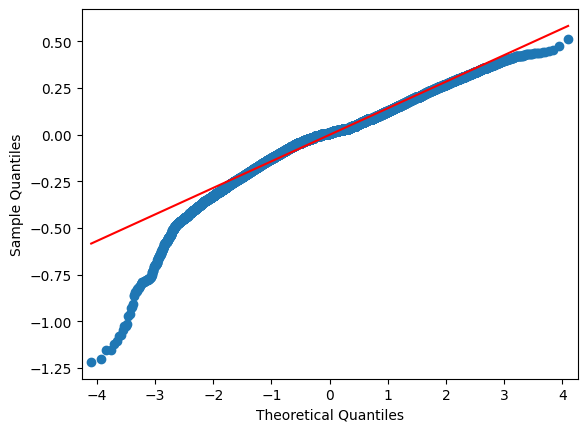

In [70]:
modelre2 = ols('Score ~ C(Genres)' , data = dfTest2).fit()

## plotting qq plot again
sm.qqplot(modelre2.resid, line='s')
plt.show()


## not much changes in both transformation we move to next check of homogenieity of variances with the not changed set 

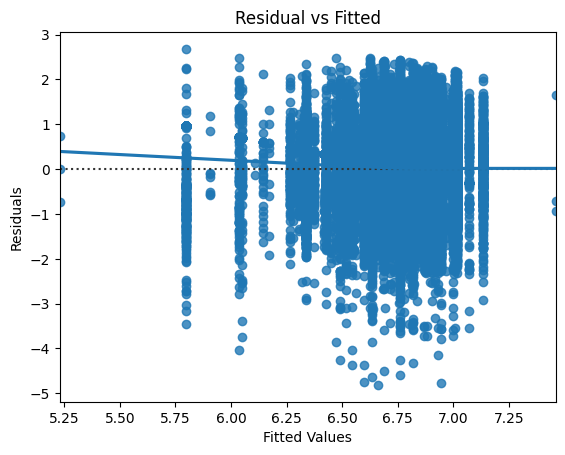

In [71]:
sns.residplot(x = model.fittedvalues , y= model.resid , lowess = True)
plt.xlabel('Fitted Values')
plt.ylabel('Residuals')
plt.title('Residual vs Fitted')
plt.show()

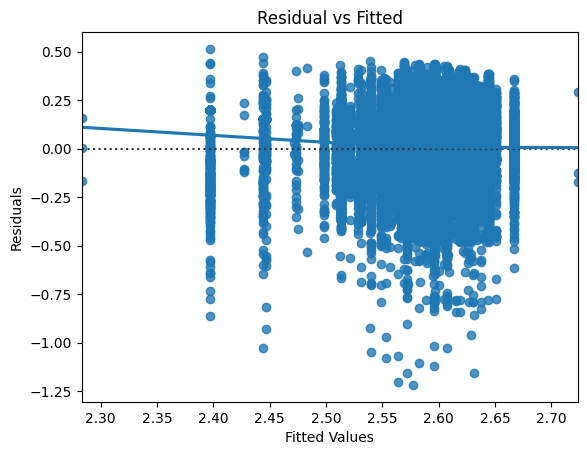

In [72]:
sns.residplot(x = modelre2.fittedvalues , y= modelre2.resid , lowess = True)
plt.xlabel('Fitted Values')
plt.ylabel('Residuals')
plt.title('Residual vs Fitted')
plt.show()

In [73]:
## Checkin for outliers 

Q1 = np.percentile(df_exploded['Score'], 25)
Q3 = np.percentile(df_exploded['Score'], 75)
IQR = Q3 - Q1
outliers = (df_exploded['Score'] < (Q1 - 1.5 * IQR)) | (df_exploded['Score'] > (Q3 + 1.5 * IQR))

outliers.value_counts()


Score
False    45694
True      2486
Name: count, dtype: int64

In [74]:
df_filtered = df_exploded[~outliers]

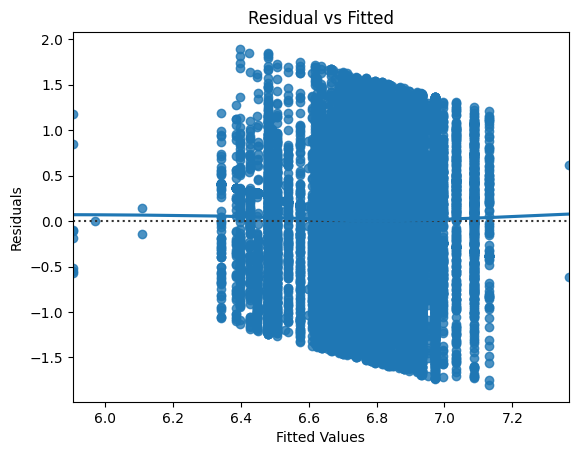

In [75]:
modelre3 = ols('Score ~ C(Genres)' , data = df_filtered).fit()

sns.residplot(x = modelre3.fittedvalues , y= modelre3.resid , lowess = True)
plt.xlabel('Fitted Values')
plt.ylabel('Residuals')
plt.title('Residual vs Fitted')
plt.show()

C:\Users\kswap\AppData\Local\Temp\ipykernel_4804\289954051.py:1: UserWarning: 

`distplot` is a deprecated function and will be removed in seaborn v0.14.0.

Please adapt your code to use either `displot` (a figure-level function with
similar flexibility) or `histplot` (an axes-level function for histograms).

For a guide to updating your code to use the new functions, please see
https://gist.github.com/mwaskom/de44147ed2974457ad6372750bbe5751

  sns.distplot(df_filtered['Score'])


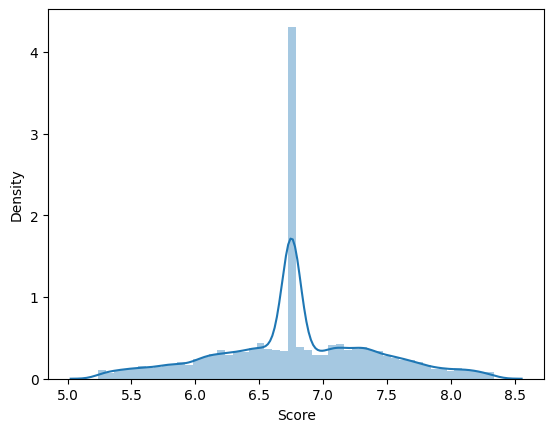

In [76]:
sns.distplot(df_filtered['Score'])
plt.show()

In [77]:
## removing outlier might not be effective as we thought so just leaving the data with it 

In [78]:
#ANOVA
anovaT = sm.stats.anova_lm(model , type = 2)
print(anovaT)


                df        sum_sq    mean_sq          F  PR(>F)
C(Genres)     80.0   1807.863564  22.598295  43.049311     0.0
Residual   48099.0  25249.077101   0.524940        NaN     NaN


##### From this we conclude that the null hypothesis of there not being significant differences between Genre and Score is rejected
## implying that scores are effected with change of genres

### Creating wordcloud for the genres and synopsis 

In [79]:
genres = []

for i in synopsisDf['Genres']:
    for j in i:
        genres.append(i)
    
genres = str(genres)

In [80]:
genres

"[['Action', ' Adventure', ' Comedy', ' Drama', ' Sci-Fi', ' Space'], ['Action', ' Adventure', ' Comedy', ' Drama', ' Sci-Fi', ' Space'], ['Action', ' Adventure', ' Comedy', ' Drama', ' Sci-Fi', ' Space'], ['Action', ' Adventure', ' Comedy', ' Drama', ' Sci-Fi', ' Space'], ['Action', ' Adventure', ' Comedy', ' Drama', ' Sci-Fi', ' Space'], ['Action', ' Adventure', ' Comedy', ' Drama', ' Sci-Fi', ' Space'], ['Action', ' Drama', ' Mystery', ' Sci-Fi', ' Space'], ['Action', ' Drama', ' Mystery', ' Sci-Fi', ' Space'], ['Action', ' Drama', ' Mystery', ' Sci-Fi', ' Space'], ['Action', ' Drama', ' Mystery', ' Sci-Fi', ' Space'], ['Action', ' Drama', ' Mystery', ' Sci-Fi', ' Space'], ['Action', ' Sci-Fi', ' Adventure', ' Comedy', ' Drama', ' Shounen'], ['Action', ' Sci-Fi', ' Adventure', ' Comedy', ' Drama', ' Shounen'], ['Action', ' Sci-Fi', ' Adventure', ' Comedy', ' Drama', ' Shounen'], ['Action', ' Sci-Fi', ' Adventure', ' Comedy', ' Drama', ' Shounen'], ['Action', ' Sci-Fi', ' Adventure',

In [81]:
from wordcloud import WordCloud

In [82]:
genreWc = WordCloud(width = 1500 , height = 800 , background_color = 'black' , min_font_size = 2 , min_word_length = 3).generate(genres)

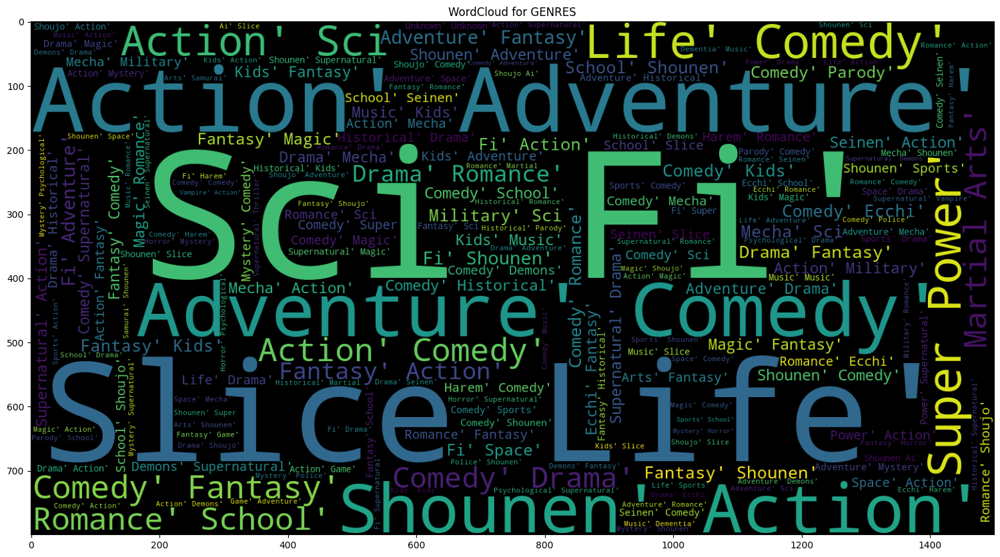

In [83]:
plt.figure(figsize = (30,10))
plt.title('WordCloud for GENRES')
plt.imshow(genreWc)

## Building Recommendation System

#### starting with baseline model which recommends/shows the popular shows 

In [84]:
realScore.columns

Index(['MAL_ID', 'Name', 'Score', 'Genres', 'English name', 'Type', 'Episodes',
       'Aired', 'Producers', 'Studios', 'Source', 'Duration', 'Rating',
       'Ranked', 'Popularity', 'Members', 'Favorites', 'Watching', 'Dropped',
       'Plan to Watch', 'Score-1', 'Score-2', 'Score-3', 'Score-4', 'Score-5',
       'Score-6', 'Score-7', 'Score-8', 'Score-9', 'Score-10', 'totalRatings',
       'Premiere', 'Finished_Airing', 'lgTR'],
      dtype='object')

In [85]:
realScore['Popularity'].describe()

count    17562.000000
mean      8763.452340
std       5059.327278
min          0.000000
25%       4383.500000
50%       8762.500000
75%      13145.000000
max      17565.000000
Name: Popularity, dtype: float64

In [86]:
realScore.sort_values('Popularity' , ascending = False)

,MAL_ID,Name,Score,Genres,English name,Type,Episodes,Aired,Producers,Studios,...,Score-5,Score-6,Score-7,Score-8,Score-9,Score-10,totalRatings,Premiere,Finished_Airing,lgTR
17560,48491,Yama no Susume: Next Summit,0.00,"[Adventure, Slice of Life, Comedy]",Unknown,TV,0.0,Unknown,Kadokawa,8bit,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,Unknown,1,NaN
17555,48471,Tsuki to Laika to Nosferatu,0.00,"[Sci-Fi, Space, Vampire]",Unknown,TV,0.0,"[2021 , ?]",Bandai Namco Arts,Arvo Animation,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,2021,0,NaN
17561,48492,Scarlet Nexus,0.00,"[Action, Fantasy]",Unknown,TV,0.0,"[Jul, 2021 , ?]",Bandai Namco Arts,Sunrise,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,"Jul, 2021",0,NaN
17558,48483,Mieruko-chan,0.00,"[Comedy, Horror, Supernatural]",Unknown,TV,0.0,"[2021 , ?]",Kadokawa,Passione,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,2021,0,NaN
17553,48466,Kyoukai Senki,0.00,"[Action, Mecha]",Unknown,TV,0.0,"[Oct, 2021 , ?]",Bandai Spirits,Sunrise Beyond,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,"Oct, 2021",0,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
3971,5114,Fullmetal Alchemist: Brotherhood,9.19,"[Action, Military, Adventure, Comedy, Dram...",Fullmetal Alchemist:Brotherhood,TV,64.0,"[Apr 5, 2009 , Jul 4, 2010]","Aniplex, Square Enix, Mainichi Broadcasting Sy...",Bones,...,9305.0,20206.0,70031.0,199136.0,401475.0,714776.0,1438650.0,"Apr 5, 2009",1,14.179216
7449,16498,Shingeki no Kyojin,8.48,"[Action, Military, Mystery, Super Power, D...",Attack on Titan,TV,25.0,"[Apr 7, 2013 , Sep 29, 2013]","Production I.G, Dentsu, Mainichi Broadcasting ...",Wit Studio,...,31140.0,70766.0,220219.0,459100.0,514862.0,470865.0,1791039.0,"Apr 7, 2013",1,14.398306
1393,1535,Death Note,8.63,"[Mystery, Police, Psychological, Supernatur...",Death Note,TV,37.0,"[Oct 4, 2006 , Jun 27, 2007]","VAP, Konami, Ashi Production, Nippon Televisio...",Madhouse,...,28047.0,68573.0,201509.0,415866.0,535231.0,557393.0,1826613.0,"Oct 4, 2006",1,14.417974
17548,48427,"The Sun, Moon and Stars",0.00,[Music],Unknown,Music,1.0,"[Jan 18, 2021]",Unknown,Unknown,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,"Jan 18, 2021",-1,NaN


In [87]:
popDf = realScore[realScore['Popularity'] != 0]

In [88]:
popDf = popDf.sort_values('Popularity' , ascending = True)

Text(0, 0.5, 'Animes')

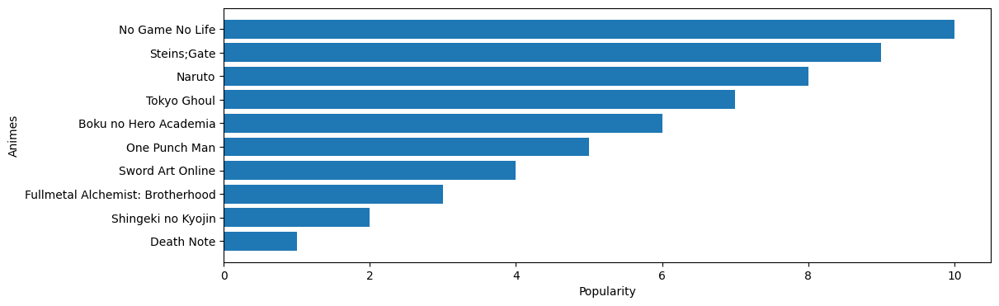

In [89]:
plt.figure(figsize=(12,4))

plt.barh(popDf['Name'].head(10) , popDf['Popularity'].head(10) , align = 'center' )
plt.xlabel('Popularity')
plt.ylabel('Animes')

### Content Based Filtering

In [90]:
overviewDf = synopsisDf[['MAL_ID' , 'sypnopsis' ]]

In [91]:
overviewDf.head(5)

,MAL_ID,sypnopsis
0,1,"In the year 2071, humanity has colonized sever..."
1,5,"other day, another bounty—such is the life of ..."
2,6,"Vash the Stampede is the man with a $$60,000,0..."
3,7,ches are individuals with special powers like ...
4,8,It is the dark century and the people are suff...


In [92]:
mergedData = pd.merge(realScore , overviewDf , on = 'MAL_ID' , how = 'left')
mergedData

,MAL_ID,Name,Score,Genres,English name,Type,Episodes,Aired,Producers,Studios,...,Score-6,Score-7,Score-8,Score-9,Score-10,totalRatings,Premiere,Finished_Airing,lgTR,sypnopsis
0,1,Cowboy Bebop,8.78,"[Action, Adventure, Comedy, Drama, Sci-Fi,...",Cowboy Bebop,TV,26.0,"[Apr 3, 1998 , Apr 24, 1999]",Bandai Visual,Sunrise,...,20686.0,62310.0,131599.0,182105.0,229153.0,641616.0,"Apr 3, 1998",1,13.371745,"In the year 2071, humanity has colonized sever..."
1,5,Cowboy Bebop: Tengoku no Tobira,8.39,"[Action, Drama, Mystery, Sci-Fi, Space]",Cowboy Bebop:The Movie,Movie,1.0,"[Sep 1, 2001]","Sunrise, Bandai Visual",Bones,...,5805.0,22632.0,49505.0,49199.0,30043.0,160347.0,"Sep 1, 2001",-1,11.985095,"other day, another bounty—such is the life of ..."
2,6,Trigun,8.24,"[Action, Sci-Fi, Adventure, Comedy, Drama,...",Trigun,TV,26.0,"[Apr 1, 1998 , Sep 30, 1998]",Victor Entertainment,Madhouse,...,15373.0,49424.0,86134.0,75648.0,50226.0,286119.0,"Apr 1, 1998",1,12.564163,"Vash the Stampede is the man with a $$60,000,0..."
3,7,Witch Hunter Robin,7.27,"[Action, Mystery, Police, Supernatural, Dr...",Witch Hunter Robin,TV,26.0,"[Jul 2, 2002 , Dec 24, 2002]","TV Tokyo, Bandai Visual, Dentsu, Victor Entert...",Sunrise,...,5706.0,11615.0,10126.0,4806.0,2182.0,39086.0,"Jul 2, 2002",1,10.573520,ches are individuals with special powers like ...
4,8,Bouken Ou Beet,6.98,"[Adventure, Fantasy, Shounen, Supernatural]",Beet the Vandel Buster,TV,52.0,"[Sep 30, 2004 , Sep 29, 2005]","TV Tokyo, Dentsu",Toei Animation,...,1068.0,1712.0,1242.0,529.0,312.0,5922.0,"Sep 30, 2004",1,8.686430,It is the dark century and the people are suff...
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
17557,48481,Daomu Biji Zhi Qinling Shen Shu,0.00,"[Adventure, Mystery, Supernatural]",Unknown,ONA,0.0,"[Apr 4, 2021 , ?]",Unknown,Unknown,...,0.0,1.0,0.0,0.0,0.0,1.0,"Apr 4, 2021",0,0.000000,No synopsis information has been added to this...
17558,48483,Mieruko-chan,0.00,"[Comedy, Horror, Supernatural]",Unknown,TV,0.0,"[2021 , ?]",Kadokawa,Passione,...,0.0,0.0,0.0,0.0,0.0,0.0,2021,0,NaN,ko is a typical high school student whose life...
17559,48488,Higurashi no Naku Koro ni Sotsu,0.00,"[Mystery, Dementia, Horror, Psychological, ...",Higurashi:When They Cry – SOTSU,TV,0.0,"[Jul, 2021 , ?]",Unknown,Unknown,...,0.0,0.0,0.0,0.0,1.0,1.0,"Jul, 2021",0,0.000000,Sequel to Higurashi no Naku Koro ni Gou .
17560,48491,Yama no Susume: Next Summit,0.00,"[Adventure, Slice of Life, Comedy]",Unknown,TV,0.0,Unknown,Kadokawa,8bit,...,0.0,0.0,0.0,0.0,0.0,0.0,Unknown,1,NaN,New Yama no Susume anime.


In [93]:
mergedData['sypnopsis'].head(5)

0    In the year 2071, humanity has colonized sever...
1    other day, another bounty—such is the life of ...
2    Vash the Stampede is the man with a $$60,000,0...
3    ches are individuals with special powers like ...
4    It is the dark century and the people are suff...
Name: sypnopsis, dtype: object

In [94]:
mergedData.rename(columns={'sypnopsis' : 'synop'} , inplace = True)

In [95]:
## will be using TfIdVectorizer
from sklearn.feature_extraction.text import TfidfVectorizer

tfidf = TfidfVectorizer(stop_words = 'english')

#replacing NaN with empty strings
mergedData['synop'] = mergedData['synop'].fillna('')

#constructing the tfidf matrix 
tfidf_matrix = tfidf.fit_transform(mergedData['synop'])

In [96]:
tfidf_matrix.shape

(17562, 45064)

In [97]:
# COSINE SIMILARITY SCORE

from sklearn.metrics.pairwise import cosine_similarity
cosine_sim = cosine_similarity(tfidf_matrix)

In [98]:
sim_df = pd.DataFrame(cosine_sim , index = mergedData['Name'] , columns = mergedData['Name'])

In [99]:
# Function that takes in anime title as input and outputs most similar ones

def getRec(Name , cosine_sim = cosine_sim):
    idx = sim_df.index.get_loc(Name)
    
    #getting top 10 similar animes
    top10 = sim_df.iloc[idx].sort_values(ascending = False)[1:11]
    
    return top10

In [100]:
getRec('Death Note')

Name
Death Note: Rewrite                       0.262114
Soul Eater                                0.189367
Shinigami no Ballad.                      0.163707
Kite Liberator                            0.159250
Dia Horizon (Kabu)                        0.158764
YAT Anshin! Uchuu Ryokou 2                0.156419
Nissan Note x The World of Golden Eggs    0.153591
Yami no Matsuei                           0.145328
Bleach: Memories in the Rain              0.143885
Yami no Shihosha Judge                    0.137107
Name: Death Note, dtype: float64

In [101]:
genresCombined = mergedData['Genres']

In [102]:
for i in range(len(genresCombined)):
    genresCombined[i] = ' '.join(genresCombined[i]) 

C:\Users\kswap\AppData\Local\Temp\ipykernel_4804\4010711379.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  genresCombined[i] = ' '.join(genresCombined[i])
C:\Users\kswap\AppData\Local\Temp\ipykernel_4804\4010711379.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  genresCombined[i] = ' '.join(genresCombined[i])
C:\Users\kswap\AppData\Local\Temp\ipykernel_4804\4010711379.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  genresC

C:\Users\kswap\AppData\Local\Temp\ipykernel_4804\4010711379.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  genresCombined[i] = ' '.join(genresCombined[i])
C:\Users\kswap\AppData\Local\Temp\ipykernel_4804\4010711379.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  genresCombined[i] = ' '.join(genresCombined[i])
C:\Users\kswap\AppData\Local\Temp\ipykernel_4804\4010711379.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  genresC

C:\Users\kswap\AppData\Local\Temp\ipykernel_4804\4010711379.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  genresCombined[i] = ' '.join(genresCombined[i])
C:\Users\kswap\AppData\Local\Temp\ipykernel_4804\4010711379.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  genresCombined[i] = ' '.join(genresCombined[i])
C:\Users\kswap\AppData\Local\Temp\ipykernel_4804\4010711379.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  genresC

C:\Users\kswap\AppData\Local\Temp\ipykernel_4804\4010711379.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  genresCombined[i] = ' '.join(genresCombined[i])
C:\Users\kswap\AppData\Local\Temp\ipykernel_4804\4010711379.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  genresCombined[i] = ' '.join(genresCombined[i])
C:\Users\kswap\AppData\Local\Temp\ipykernel_4804\4010711379.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  genresC

C:\Users\kswap\AppData\Local\Temp\ipykernel_4804\4010711379.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  genresCombined[i] = ' '.join(genresCombined[i])
C:\Users\kswap\AppData\Local\Temp\ipykernel_4804\4010711379.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  genresCombined[i] = ' '.join(genresCombined[i])
C:\Users\kswap\AppData\Local\Temp\ipykernel_4804\4010711379.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  genresC

C:\Users\kswap\AppData\Local\Temp\ipykernel_4804\4010711379.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  genresCombined[i] = ' '.join(genresCombined[i])
C:\Users\kswap\AppData\Local\Temp\ipykernel_4804\4010711379.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  genresCombined[i] = ' '.join(genresCombined[i])
C:\Users\kswap\AppData\Local\Temp\ipykernel_4804\4010711379.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  genresC

C:\Users\kswap\AppData\Local\Temp\ipykernel_4804\4010711379.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  genresCombined[i] = ' '.join(genresCombined[i])
C:\Users\kswap\AppData\Local\Temp\ipykernel_4804\4010711379.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  genresCombined[i] = ' '.join(genresCombined[i])
C:\Users\kswap\AppData\Local\Temp\ipykernel_4804\4010711379.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  genresC

IOPub data rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_data_rate_limit`.

Current values:
NotebookApp.iopub_data_rate_limit=1000000.0 (bytes/sec)
NotebookApp.rate_limit_window=3.0 (secs)



In [103]:
## Now trying this with genres
tfidf_matrix2 = tfidf.fit_transform(genresCombined)

#cosine sim
cosine_sim2 = cosine_similarity(tfidf_matrix2)

In [104]:
sim_df2 = pd.DataFrame(cosine_sim2 , index = mergedData['Name'] , columns = mergedData['Name'])

In [105]:
def getRec2(Name , cosine_sim = cosine_sim2):
    idx = sim_df2.index.get_loc(Name)
    
    #getting top 10 similar animes
    top10 = sim_df2.iloc[idx].sort_values(ascending = False)[1:11]
    
    return top10

In [106]:
getRec2('Death Note')

Name
Death Note: Rewrite                               0.960532
B: The Beginning Succession                       0.935554
B: The Beginning                                  0.935554
Yakusoku no Neverland 2nd Season: Michishirube    0.883366
Mousou Dairinin                                   0.859355
Mirai Nikki                                       0.856396
Higurashi no Naku Koro ni Kai                     0.838425
Higurashi no Naku Koro ni Rei                     0.818863
Mi Yu Xing Zhe                                    0.779202
Babylon                                           0.779202
Name: Death Note, dtype: float64

### User Collaborative Filtering

In [107]:
import scipy.stats
import psutil

In [108]:
mergedData['Name'].nunique()

17558

In [109]:
mergedData.columns

Index(['MAL_ID', 'Name', 'Score', 'Genres', 'English name', 'Type', 'Episodes',
       'Aired', 'Producers', 'Studios', 'Source', 'Duration', 'Rating',
       'Ranked', 'Popularity', 'Members', 'Favorites', 'Watching', 'Dropped',
       'Plan to Watch', 'Score-1', 'Score-2', 'Score-3', 'Score-4', 'Score-5',
       'Score-6', 'Score-7', 'Score-8', 'Score-9', 'Score-10', 'totalRatings',
       'Premiere', 'Finished_Airing', 'lgTR', 'synop'],
      dtype='object')

In [110]:
animeF = mergedData.drop(columns = ['Score-1', 'Score-2', 'Score-3', 'Score-4', 'Score-5',
       'Score-6', 'Score-7', 'Score-8', 'Score-9', 'Score-10' , 'Episodes', 'Members' ,'Plan to Watch' , 'English name' , 'Favorites'] , axis = 1)

In [111]:
animeF['MAL_ID'].nunique()

17562

In [112]:
animeF['lgTR'].describe()

count    17265.000000
mean         6.702876
std          2.617942
min          0.000000
25%          4.510860
50%          6.505784
75%          8.551788
max         14.417974
Name: lgTR, dtype: float64

In [113]:
ratingDf.rename(columns = {'anime_id' : 'MAL_ID' , 'rating' : 'user_rating'} , inplace = True)

In [114]:
ratingDf.user_id.nunique()

876

In [115]:
dfFinal = pd.merge(ratingDf, animeF, on='MAL_ID', how='inner')

In [116]:
dfFinal.columns

Index(['user_id', 'MAL_ID', 'user_rating', 'Name', 'Score', 'Genres', 'Type',
       'Aired', 'Producers', 'Studios', 'Source', 'Duration', 'Rating',
       'Ranked', 'Popularity', 'Watching', 'Dropped', 'totalRatings',
       'Premiere', 'Finished_Airing', 'lgTR', 'synop'],
      dtype='object')

user_id,0,1,2,3,4,5,6,7,8,10,...,992,993,994,995,996,997,998,999,1000,1001
Name,,,,,,,,,,,,,,,,,,,,,
"""0""",NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,4.71,NaN,NaN,NaN,NaN,NaN,NaN
"""Aesop"" no Ohanashi yori: Ushi to Kaeru, Yokubatta Inu",NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
"""Bungaku Shoujo"" Kyou no Oyatsu: Hatsukoi",NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
"""Bungaku Shoujo"" Memoire",NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
"""Bungaku Shoujo"" Movie",NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
xxxHOLiC Movie: Manatsu no Yoru no Yume,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,7.96,NaN,NaN,NaN
xxxHOLiC Rou,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
xxxHOLiC Shunmuki,NaN,NaN,NaN,NaN,8.08,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


In [118]:
matrix = dfFinal.pivot_table(index = 'user_id' , columns = 'Name' , values = 'user_rating' )

In [119]:
matrix.fillna(0 , inplace = True)

In [120]:
matrix.head()

Name,"""0""","""Aesop"" no Ohanashi yori: Ushi to Kaeru, Yokubatta Inu","""Bungaku Shoujo"" Kyou no Oyatsu: Hatsukoi","""Bungaku Shoujo"" Memoire","""Bungaku Shoujo"" Movie","""Calpis"" Hakkou Monogatari","""Eiji""","""Kiss Dekiru Gyoza"" x Mameshiba Movie","""Star""t",.hack//G.U. Returner,...,s.CRY.ed,s.CRY.ed Alteration I: Tao,the FLY BanD!,xxxHOLiC,xxxHOLiC Kei,xxxHOLiC Movie: Manatsu no Yoru no Yume,xxxHOLiC Rou,xxxHOLiC Shunmuki,ēlDLIVE,◯
user_id,,,,,,,,,,,,,,,,,,,,,
0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
1,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
2,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
3,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
4,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,8.0,9.0,0.0,0.0,8.0,0.0,0.0


In [121]:
matrixN = matrix.subtract(matrix.mean(axis=1), axis = 'rows')
matrixN.head()

Name,"""0""","""Aesop"" no Ohanashi yori: Ushi to Kaeru, Yokubatta Inu","""Bungaku Shoujo"" Kyou no Oyatsu: Hatsukoi","""Bungaku Shoujo"" Memoire","""Bungaku Shoujo"" Movie","""Calpis"" Hakkou Monogatari","""Eiji""","""Kiss Dekiru Gyoza"" x Mameshiba Movie","""Star""t",.hack//G.U. Returner,...,s.CRY.ed,s.CRY.ed Alteration I: Tao,the FLY BanD!,xxxHOLiC,xxxHOLiC Kei,xxxHOLiC Movie: Manatsu no Yoru no Yume,xxxHOLiC Rou,xxxHOLiC Shunmuki,ēlDLIVE,◯
user_id,,,,,,,,,,,,,,,,,,,,,
0,-0.025447,-0.025447,-0.025447,-0.025447,-0.025447,-0.025447,-0.025447,-0.025447,-0.025447,-0.025447,...,-0.025447,-0.025447,-0.025447,-0.025447,-0.025447,-0.025447,-0.025447,-0.025447,-0.025447,-0.025447
1,-0.081548,-0.081548,-0.081548,-0.081548,-0.081548,-0.081548,-0.081548,-0.081548,-0.081548,-0.081548,...,-0.081548,-0.081548,-0.081548,-0.081548,-0.081548,-0.081548,-0.081548,-0.081548,-0.081548,-0.081548
2,-0.041757,-0.041757,-0.041757,-0.041757,-0.041757,-0.041757,-0.041757,-0.041757,-0.041757,-0.041757,...,-0.041757,-0.041757,-0.041757,-0.041757,-0.041757,-0.041757,-0.041757,-0.041757,-0.041757,-0.041757
3,-0.235311,-0.235311,-0.235311,-0.235311,-0.235311,-0.235311,-0.235311,-0.235311,-0.235311,-0.235311,...,-0.235311,-0.235311,-0.235311,-0.235311,-0.235311,-0.235311,-0.235311,-0.235311,-0.235311,-0.235311
4,-0.088721,-0.088721,-0.088721,-0.088721,-0.088721,-0.088721,-0.088721,-0.088721,-0.088721,-0.088721,...,-0.088721,-0.088721,-0.088721,7.911279,8.911279,-0.088721,-0.088721,7.911279,-0.088721,-0.088721


### Identifying similar users

In [122]:
userSim = matrixN.T.corr()

In [123]:
userSim.head()

user_id,0,1,2,3,4,5,6,7,8,10,...,992,993,994,995,996,997,998,999,1000,1001
user_id,,,,,,,,,,,,,,,,,,,,,
0,1.000000,0.016030,-0.004056,-0.002169,0.098278,0.055395,0.115887,0.040595,0.059246,-0.001115,...,0.071755,0.050433,0.047115,0.046150,-0.001392,0.066824,0.068711,0.067275,0.005535,-0.000570
1,0.016030,1.000000,0.230172,0.135542,0.028696,0.031707,0.033961,0.120446,0.057573,-0.001940,...,0.037948,0.013195,0.257582,0.201174,-0.002422,0.281046,0.140955,0.169137,0.194840,-0.000992
2,-0.004056,0.230172,1.000000,0.131217,0.074561,0.020044,0.053974,0.079075,0.025753,-0.001369,...,0.081544,0.014832,0.217636,0.127377,-0.001708,0.134234,0.114152,0.162704,0.147089,-0.000699
3,-0.002169,0.135542,0.131217,1.000000,0.048280,0.051591,0.067158,0.226570,0.094465,-0.003446,...,0.002978,0.048280,0.110188,0.172328,0.041872,0.199368,0.306052,0.048822,0.279664,-0.001761
4,0.098278,0.028696,0.074561,0.048280,1.000000,0.052536,0.074398,0.031427,0.018595,-0.002076,...,0.050944,0.158160,0.052354,0.014604,0.033276,0.036363,0.146700,0.038169,0.021767,-0.001061


In [137]:
pId = 87
userSimR = userSim.copy()
userSimR.drop(index=pId, inplace=True)
#setting threshold
userSim_threshold = 0.3
    #getting top 10 similar users
simUser = userSimR[userSimR[87] > userSim_threshold ][87].sort_values(ascending = False)[:10]

#removing animes that pId has watched 
pid_watched = matrixN[matrixN.index == pId].dropna(axis = 1 , how = 'all')
    
    #removing animes with missing values and keeping USER ids with similar animes
simUser_anime = matrixN[matrixN.index.isin(simUser.index)].dropna(axis = 1 , how = 'all')
pid_watched

Name
user_id


In [145]:
def recAnim(pId):
    userSimR = userSim.copy()
    
    # Removed picked user ID from the list
    if pId in userSimR.index:
        userSimR.drop(index=pId, inplace=True)
    else:
        print(f"User ID {pId} not found in database.")
        return
    
    # Setting threshold
    userSim_threshold = 0.3
    
    # Getting top 10 similar users
    simUser = userSimR[userSimR[pId] > userSim_threshold][pId].sort_values(ascending=False)[:10]
    if simUser.empty:
        print(f"No similar users found for user ID {pId} with threshold {userSim_threshold}.")
        return
    
    # Removing animes that pId has watched
    pid_watched = matrixN[matrixN.index == pId].dropna(axis=1, how='all')
    if pid_watched.empty:
        print(f"No animes found that user ID {pId} has watched.")
        return
    
    # Removing animes with missing values and keeping user IDs with similar animes
    simUser_anime = matrixN[matrixN.index.isin(simUser.index)].dropna(axis=1, how='all')
    if simUser_anime.empty:
        print(f"No animes found for similar users of user ID {pId}.")
        return
    
    
    
    # Create a new dataframe with column names as a single column
    column_names_series = pd.Series(simUser_anime.columns, name='Animes')
    column_names_df = pd.DataFrame(column_names_series)
    rec = column_names_df.head(10)
    
    print(rec)

In [146]:
recAnim(1000)

                                              Animes
0                                                "0"
1  "Aesop" no Ohanashi yori: Ushi to Kaeru, Yokub...
2          "Bungaku Shoujo" Kyou no Oyatsu: Hatsukoi
3                           "Bungaku Shoujo" Memoire
4                             "Bungaku Shoujo" Movie
5                         "Calpis" Hakkou Monogatari
6                                             "Eiji"
7              "Kiss Dekiru Gyoza" x Mameshiba Movie
8                                            "Star"t
9                               .hack//G.U. Returner


In [147]:
getRec('Crayon Shin-chan')

Name
Crayon Shin-chan Manatsu no Yoru ni Ora Sanjou! Arashi wo Yobu Den-O vs. Shin-O 60-bu Special!!    0.355276
Kamen Rider Fourze x Crayon Shin-chan                                                              0.295176
Shinjuku Shin-chan: Yoiko no Koutsuu Anzen                                                         0.284898
Crayon Shin-chan x Panpaka Pants: Aeon Cinema Manner Movie Collab                                  0.258612
Super Shiro                                                                                        0.236915
Daruma-chan                                                                                        0.226627
Ashita Sekai ga Owaru toshitemo                                                                    0.214804
Hokuto no Ken Zero: Kenshirou Den                                                                  0.204532
Hai! Akko Desu                                                                                     0.201701
Kenja no Mago          

### Weighted Hybrid Rec System

In [148]:

def combineRec(Name):
    synopRec = getRec(Name)
    genreRec = getRec2(Name)
    
    synopDf = synopRec.reset_index()
    synopDf.rename(columns = {Name : 'synop-score'} , inplace = True)
    
    genreDf = genreRec.reset_index()
    genreDf.rename(columns = {Name : 'genre-score'} , inplace = True)
    
    combineRecdf = pd.merge(synopDf , genreDf , on = 'Name' , how = 'outer').fillna(0)
    combineRecdf['weighted-score'] = (combineRecdf['synop-score'] * 0.6) + (combineRecdf['genre-score'] * 0.4)

    combineRecdf = combineRecdf.sort_values(by = 'weighted-score' , ascending = False)
    combined_rec = combineRecdf['Name'].head(10)
    
    return combined_rec

In [149]:
combineRec('Amnesia')

14                               Nil Admirari no Tenbin
18                      Stand My Heroes: Piece of Truth
12                               Library Cross Infinite
0                     Code:Realize - Sousei no Himegimi
1     Code:Realize - Sousei no Himegimi - Set a Thie...
7                                    Jingai-san no Yome
15                              Norn9: Norn+Nonet Recap
13              Milky Passion: Dougenzaka - Ai no Shiro
11                          Kuro to Kin no Akanai Kagi.
9                                         Karneval (TV)
Name: Name, dtype: object

### Hybrid Rec System for Cold start

In [150]:
pip install fuzzywuzzy[speedup]

In [151]:
from fuzzywuzzy import process

In [152]:
def find_closest_match(Name, df = realScore, column_name='Name'):
    names = df[column_name].tolist()
    closest_match, score = process.extractOne(Name, names)
    return closest_match

In [153]:
def hybridRec(pId):
    
    if pId in userSim.index:
        return recAnim(pId)
    else:
        Name = input("Enter the anime you like: ")
        closest_match = find_closest_match(Name)
        print(f"The closest match to '{Name}' is '{closest_match}'")
        return combineRec(closest_match)
    
    
    
        

In [155]:
hybridRec(1000)

                                              Animes
0                                                "0"
1  "Aesop" no Ohanashi yori: Ushi to Kaeru, Yokub...
2          "Bungaku Shoujo" Kyou no Oyatsu: Hatsukoi
3                           "Bungaku Shoujo" Memoire
4                             "Bungaku Shoujo" Movie
5                         "Calpis" Hakkou Monogatari
6                                             "Eiji"
7              "Kiss Dekiru Gyoza" x Mameshiba Movie
8                                            "Star"t
9                               .hack//G.U. Returner
